# Test Results on Scaling to Larger Models

The aim of this notebook is to illustrate some results on conducting Bayesian inference on Network FKPP models of varying complexity. Here, complexity is modified by changing the size of the network.

## Model setup


In [1]:
import netwin as nw 
from netwin.models import NetworkFKPP
from netwin import Model, VBModel, infer

import numpy as np 
import matplotlib.pyplot as plt

Firstly, we constract a network using $n$ random samples from a normal distribution. This is made so emulate an adjancency matrix by filling the diagonals with zeros. Values are normalised and made positive.

In [2]:
# size of network 
n = 5

# make network
A = np.reshape(np.random.normal(10, 20, n**2), (n, n))
np.fill_diagonal(A, 0)

# normalise and make positive
A = A / np.max(A)
A = np.positive(A)

Model is initialised with some intial values

In [3]:
m = NetworkFKPP(A)

# random values for initial node parameters
p = np.random.uniform(0,0.5,n)

# set the model parameters along with node parameters
u0 = np.append(p, [0.5, 3.0])

# define the time over which we wish to simulate
m.t = np.linspace(0,2,50)


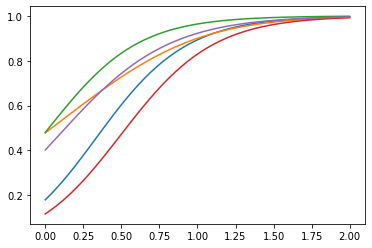

In [4]:
sim = m.forward(np.log(u0))

plt.plot(m.t, sim)
plt.show()

## Inference

We conduct infernece using analytic variational inference,using samples from the integration of the model as synthetic data. 

In [5]:
# set guess for initial node concentration
p0 = np.ones([n])

# append initial guess for model parameters
u_guess = np.append(p0, [1.0,1.0])

# Instantiate probablistic model of type VBModel
ProbModel = VBModel(model=m, data=sim, init_means=u_guess)

With the probablistic model initialised, we can optimise using the infer function and plot the Free energy convergence

Finished!


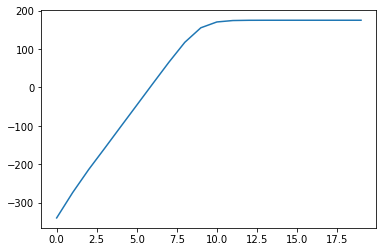

In [6]:
pm = infer(ProbModel)
plt.plot(pm.F())
plt.show()

Finally, we can plot the model parameters and initial node values to see whether we have accurate estimated parameters. 

In [7]:
from netwin import plot_2dmvn

plot_2dmvn(means=np.exp(pm.m()[-2:]), cov=pm.Cov()[-2:,-2:], n=100000)

In [8]:
from netwin import barplot_concentrations
barplot_concentrations(true=p, inferred=np.exp(pm.m()[:-2]))

## Scaling up

The inference scheme works well for low dimensional models. The model also works well when scaled up incrementally toward n = 50, at which point the model fails to converge, encountering particular problems with the diffusion parameter. Likely candidates for explaining this malfuction include becoming trapped in a local maximum and/or having trouble pushing the value for the diffusion parameter away from the prior value. 

Finished!


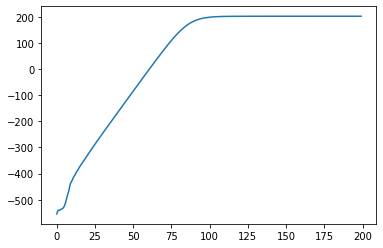

In [13]:
# size of network 
n = 40

# make network
A = np.reshape(np.random.normal(10, 20, n**2), (n, n))
np.fill_diagonal(A, 0)

# normalise and make positive
A = A / np.max(A)
A = np.positive(A)

# Make network model
m = NetworkFKPP(A)

# random values for initial node parameters
p = np.random.uniform(0,0.5,n)

# set the model parameters along with node parameters
u0 = np.append(p, [0.5, 3.0])

# define the time over which we wish to simulate
m.t = np.linspace(0,2,50)

sim = m.forward(np.log(u0))

# Instantiate probablistic model of type VBModel
ProbModel = VBModel(model=m, data=sim, init_means=np.random.normal(0,5,n+2))

pm = infer(ProbModel, n=200, verbose=False)
plt.plot(pm.F())
plt.show()

In [14]:
plot_2dmvn(means=np.exp(pm.m()[-2:]), cov=pm.Cov()[-2:,-2:], n=1000)

In [ ]:
du = -k @ L * p + a * p ( 1 - p)

In [15]:
barplot_concentrations(true=p, inferred=np.exp(pm.m()[:-2]))

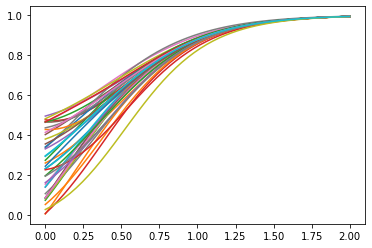

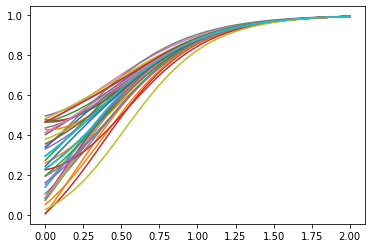

In [16]:
plt.plot(m.t, sim)
plt.show()
plt.plot(m.t, m.forward(pm.m()))
plt.show()


Whilst the free energy converges, the results are not promising. They show close correspondence to the true value for the inital node parameters and growth parameter, however, there is high uncertainty with the diffusion parameter. 

The simulated data appear to closely correspond with the original data, suggesting the optimisation may have found a local maximum with high likelihood. Another possible scenario is that the parameter value for diffusion is not moving away from the prior. 
The next step to determine whether the model is identifiable from simulated data will be to tighten the priors and further randomise the initial guesses (more variance) -- this may help the optimisation scheme push the diffusion parameter away from the prior. 

It would be worth plotting the prior predictive model. Is there some way that we can use informative priors for the model parameters?


* Try inference on pure diffusion model (is the inference placing value in the growth parameter to fit the model)
* Try distributing initial concentration at one node to place more imoprtance on the diffusion parameter in the data generating process 
* Investigate time scale of diffusion and growth parameters 

A feature of the forward model might that as the network grows, the diffusion rate becomes faster, speeding up the diffusion across the network and making protein concentration more homogeneous. There appears to be some critical point between 40 and 50 nodes where the diffusion parameter becomes non-identifiable. Seemingly, the inference places value on growth parameter, perhaps because of the increased homogeneity, the changes in protein concentration can largely be explained by growth. 

Consider a small network where all nodes have a uniform initial distribution of protein concentration. From this, the diffusion parameter would be non-identifiable. This is to say, the more homogeneous the network is, the more difficult it is to determine the diffusion coefficient, since protein concentration would largely be driven by growth. 